In [1]:
wdir = 'C:/Users/dariq/Dropbox/MEG_music_imagination_data/'

import mne
import matplotlib.pyplot as plt
import tempfile
import matplotlib.image as mpimg
import numpy as np
import pandas as pd

%pylab inline
from numpy import *
from numpy.random import rand, randn, randint
from dPCA import dPCA

Populating the interactive namespace from numpy and matplotlib


In [4]:
def default_events_fun(events):
    event_id = {str(eo): eo for eo in np.unique(events[:,2])}
    return events, event_id

def WM_epoching(data_path, ica_path, tmin, tmax, l_freq=0.1, h_freq=None,
                resample = None, bads=[], reject = None, 
                baseline = None, notch_filter=None, #baseline -1 0
                events_fun=default_events_fun, 
                events_fun_kwargs = {}):

    raw = mne.io.read_raw_fif(data_path, preload = True) # load data
    ica = mne.preprocessing.read_ica(ica_path) # load ica solution
    raw = ica.apply(raw) # apply ICA
    raw.pick_types(meg = True, stim = True, eog = False)
    raw.info['bads'] += bads
    
    if notch_filter:
        raw.notch_filter(freqs=notch_filter)
        
    raw.filter(l_freq=l_freq,h_freq=h_freq)
    
    if resample:
        raw.resample(sfreq=resample)
        
    events = mne.find_events(raw, shortest_event = 1)
    events = events[np.append(np.diff(events[:,0]) > 1,True)] # delete spurious triggers
    events, event_id = events_fun(events, **events_fun_kwargs)
    
    picks = mne.pick_types(raw.info, meg = True)
    epochs = mne.Epochs(raw, events, event_id=event_id, tmin=tmin, tmax=tmax,
                        preload=True, baseline=baseline, picks=picks,on_missing='warn')
    return epochs

mappings = {'maintenance': {'maintenance/mel1/same':   {'prev': [11,111,122], 'new': 11}, 
                            'maintenance/mel1/diff1':  {'prev': [11,213,222], 'new': 12},
                            'maintenance/mel1/diff2':  {'prev': [11,211,223], 'new': 13},
                            'maintenance/mel2/same':   {'prev': [13,113,122], 'new': 21},
                            'maintenance/mel2/diff1':  {'prev': [13,211,222], 'new': 22},
                            'maintenance/mel2/diff2':  {'prev': [13,213,221], 'new': 23}},

                'manipulation':{'manipulation/mel1/inv':    {'prev': [11,113,122], 'new': 31}, 
                            'manipulation/mel1/other1': {'prev': [11,211,222], 'new': 32},
                            'manipulation/mel1/other2': {'prev': [11,213,221], 'new': 33},
                            'manipulation/mel2/inv':    {'prev': [13,111,122], 'new': 41},
                            'manipulation/mel2/other1': {'prev': [13,213,222], 'new': 42},
                            'manipulation/mel2/other2': {'prev': [13,211,223], 'new': 43}}
           }

def main_task_events_fun(events, cond, lfname):

    events2 = events.copy()[events[:,2] < 20] # Get first tone of first melody
    events3 = events.copy()[np.isin(events[:,2]//10, [11,21]),:] # get first tone of target melody
    events4 = events.copy()[np.isin(events[:,2]//10, [12,22]),:] # get second tone of target melody
    new_events = events2
    for eid in mappings[cond]:
        p1,p4,p5 = mappings[cond][eid]['prev']
        idx = [x and y and z for x,y,z in zip(events2[:,2]==p1,events3[:,2]==p4,events4[:,2]==p5)]
        new_events[idx,2] = mappings[cond][eid]['new']
    if lfname:
        print('rejecting incorrect trials')
        ldf = pd.read_csv(lfname, sep = ',', header=0)
        ldf['acc'] = ldf['type'] == ldf['response']
        new_events = new_events[ldf['acc'], :]
        
    event_id = {ccc: mappings[cond][ccc]['new'] for ccc in mappings[cond]}
    return new_events, event_id

def main_task_decoding_events_fun(events, lfname=None):
    events2 = events.copy()[events[:,2] < 20]
    events2[:,2] = [(ev-10)%3 * -1 + 1 for ev in events2[:,2]]
  
    if lfname:
        print('rejecting incorrect trials')
        ldf = pd.read_csv(lfname, sep = ',', header=0)
        ldf['acc'] = ldf['type'] == ldf['response']
        events2 = events2[ldf['acc'], :]

    event_id = {'melody' + str(ii): ii for ii in np.unique(events2[:,2])}
    return events2, event_id

In [5]:
raw_fname = wdir + '01_raw_maxfiltered/0011_U7X/inv_raw_tsss.fif'
ica_fname = wdir + '02_ica_solution/0011_U7X/inv_raw_tsss-ica.fif'
lfname = wdir + 'working_memory_logs/0011_invert_MEG.csv'
eepochs = WM_epoching(raw_fname,ica_fname,-1, 4, 
                      baseline = (-1,0),notch_filter=50, h_freq=20,
                      events_fun = main_task_decoding_events_fun, 
                      events_fun_kwargs = {'lfname': lfname},
                      resample = 100)

Opening raw data file C:/Users/dariq/Dropbox/MEG_music_imagination_data/01_raw_maxfiltered/0011_U7X/inv_raw_tsss.fif...
    Range : 6000 ... 505999 =      6.000 ...   505.999 secs
Ready.
Reading 0 ... 499999  =      0.000 ...   499.999 secs...
Reading C:/Users/dariq/Dropbox/MEG_music_imagination_data/02_ica_solution/0011_U7X/inv_raw_tsss-ica.fif ...
Now restoring ICA solution ...
Ready.
Applying ICA to Raw instance


c:\miniconda3\envs\mne\lib\site-packages\mne\utils\check.py:92: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  LooseVersion(library.__version__) < LooseVersion(min_version):
c:\miniconda3\envs\mne\lib\site-packages\mne\utils\check.py:92: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  LooseVersion(library.__version__) < LooseVersion(min_version):


    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 306 PCA components
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 6601 samples (6.601 sec)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower 

In [6]:
# 获取数据和事件类型
data = eepochs.get_data()  # Shape: [E, C, T]
event_types = list(eepochs.event_id.keys())
n_event_types = len(event_types)
S = n_event_types
n_samples = max(len(eepochs[event]) for event in eepochs.event_id.keys())

N, T = data.shape[1], data.shape[2]  # N: channels, T: times

# 初始化 trialR 数组
trialR = np.zeros((n_samples, N, n_event_types, T))  # Shape: [n_samples, N, S, T]

# 填充 trialR 数组
for i, event in enumerate(event_types):
    event_data = eepochs[event].get_data()  # Shape: [E, C, T] for this event
    
    # padding
    if event_data.shape[0] < n_samples:
        # padding with Nan
        shortfall = n_samples - event_data.shape[0]
        filler = np.full((shortfall, N, T), np.nan)
        event_data = np.concatenate([event_data, filler], axis=0)
    
    trialR[:, :, i, :] = event_data

trialR = trialR[:,:,:,:]#100:300]
print(trialR.shape)

(30, 306, 2, 501)


In [7]:
# trial-average data
R = np.nanmean(trialR,0) #skip the Nans

# center data
R -= mean(R.reshape((N,-1)),1)[:,None,None]

In [8]:
dpca = dPCA.dPCA(labels='st',regularizer='auto')
dpca.protect = ['t']

You chose to determine the regularization parameter automatically. This can
                    take substantial time and grows linearly with the number of crossvalidation
                    folds. The latter can be set by changing self.n_trials (default = 3). Similarly,
                    use self.protect to set the list of axes that are not supposed to get to get shuffled
                    (e.g. upon splitting the data into test- and training, time-points should always
                    be drawn from the same trial, i.e. self.protect = ['t']). This can significantly
                    speed up the code.


In [9]:
Z = dpca.fit_transform(R,trialR)

Start optimizing regularization.
Starting trial  1 / 3
Starting trial  2 / 3
Starting trial  3 / 3
Optimized regularization, optimal lambda =  0.002420143235548455
Regularization will be fixed; to compute the optimal                    parameter again on the next fit, please                    set opt_regularizer_flag to True.


In [10]:
x = Z['st'].shape[0]
time = eepochs.times#arange(Z['st'].shape[2])
plt.figure(figsize=(16, 7 * x), dpi=400)

for i in range(x):
    # time component subplot
    plt.subplot(x, 3, 3 * i + 1)
    for s in range(S):
        plt.plot(time, Z['t'][i, s])
    plt.title(f'{i+1}st time component')

    # stimuli component subplot
    plt.subplot(x, 3, 3 * i + 2)
    for s in range(S):
        plt.plot(time, Z['s'][i, s])
    plt.title(f'{i+1}st stimulus component')

    # st component subplot
    plt.subplot(x, 3, 3 * i + 3)
    for s in range(S):
        plt.plot(time, Z['st'][i, s])
    plt.title(f'{i+1}st mixing component')
show()

In [12]:
masks,scores,null_scores = dpca.significance_analysis(R, trialR, n_shuffles=100, n_splits=100, n_consecutive=10, full = True, axis=True)

#significance_masks = dpca.significance_analysis(R,  trialR, n_shuffles=100, n_splits=10, n_consecutive=10)

Compute score of data:  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . Finished.
Compute score of shuffled data:  99 / 100 . . . .  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

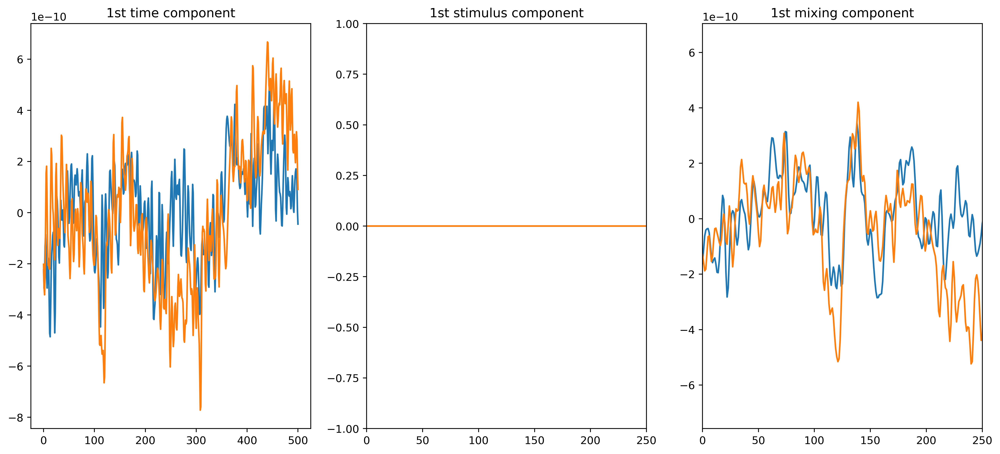

In [13]:
time = arange(T)

figure(figsize=(16,7), dpi = 400)
subplot(131)

for s in range(S):
    plot(time,Z['t'][0,s])

title('1st time component')
    
subplot(132)

for s in range(S):
    plot(time,Z['s'][0,s])

imshow(significance_masks['s'][0][None,:],extent=[0,250,amin(Z['s'])-1,amin(Z['s'])-0.5],aspect='auto',cmap='gray_r',vmin=0,vmax=1)
ylim([amin(Z['s'])-1,amax(Z['s'])+1])

title('1st stimulus component')
    
subplot(133)

for s in range(S):
    plot(time,Z['st'][0,s])

dZ = amax(Z['st'])-amin(Z['st'])
imshow(significance_masks['st'][0][None,:],extent=[0,250,amin(Z['st'])-dZ/10.,amin(Z['st'])-dZ/5.],aspect='auto',cmap='gray_r',vmin=0,vmax=1)
ylim([amin(Z['st'])-dZ/10.,amax(Z['st'])+dZ/10.])
    
title('1st mixing component')
show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(10, 8), dpi=400)
ax = fig.add_subplot(111, projection='3d')

time = np.arange(T)
stimuli = np.arange(S)

for s in range(S):
    ax.plot(Z['t'][0, s], Z['s'][0, s], time, label=f'Stimulus {s+1}')

ax.set_xlabel('Time Component')
ax.set_ylabel('Stimulus Component')
ax.set_zlabel('Time')
ax.set_title('Time and Stimulus 1st Component in 3D')

# 添加图例（可选）
ax.legend()

# 显示图形
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 假设 T 是时间点的数量，S 是刺激条件的数量
# 假设 Z['t'] 和 Z['s'] 是你从 dPCA 分析中得到的时间和刺激组件
# 它们的形状应为 (1, S, T)

# 创建图形
fig, ax = plt.subplots(figsize=(10, 8), dpi=400)

# 在2D图中绘制数据
for s in range(S):
    ax.scatter(Z['t'][0, s], Z['s'][0, s], label=f'Stimulus {s+1}')

# 设置图的标签和标题
ax.set_xlabel('Time Component')
ax.set_ylabel('Stimulus Component')
ax.set_title('2D Projection of Time and Stimulus Components')

# 添加图例（可选）
ax.legend()

# 显示图形
plt.show()

In [ ]:
Z['st'].shape

In [ ]:
import os

def list_directory_structure(root_dir):
    """
    打印给定根目录下的目录结构
    
    参数:
    root_dir (str): 根目录的路径
    
    返回:
    None
    """
    for foldername, subfolders, filenames in os.walk(root_dir):
        print(f"目录: {foldername}")
        print(f"  子目录: {subfolders}")
        print(f"  文件: {filenames}\n")

# 返回这个函数以供您使用
list_directory_structure('/Users/xiangxingyu/Downloads/UCB线上科研/data')
